In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [4]:
path_to_text = 'books_and_authors'
data = pd.read_csv(path_to_text, names=['v1', 'v2'])

label = data['v1']
text = data['v2']

text

0      Pretty soon I wanted to smoke, and asked the w...
1      Her sister, Miss Watson, a tolerable slim old ...
2      Now she had got a start, and she went on and t...
3      Miss Watson she kept pecking at me, and it got...
4      I set down again, a-shaking all over, and got ...
                             ...                        
994    I was on the point of asking him what that wor...
995      1. Knowledge of Literature.--Nil.\n  2.     ...
996    I see that I have alluded above to his powers ...
997    During the first week or so we had no callers,...
998    It was upon the 4th of March, as I have good r...
Name: v2, Length: 999, dtype: object

## TEXT PREPROCESING

In [5]:
import nltk

nltk.download('omw-1.4')
nltk.download('punkt')

from nltk.corpus import stopwords, wordnet

nltk.download('stopwords')
stopwords_ = stopwords.words('english')

nltk.download('wordnet')

from nltk.stem import WordNetLemmatizer

wnl = WordNetLemmatizer()

nltk.download('averaged_perceptron_tagger')

def get_wordnet_pos(tag):
    if tag.startswith('J'):
        return wordnet.ADJ
    elif tag.startswith('V'):
        return wordnet.VERB
    elif tag.startswith('N'):
        return wordnet.NOUN
    elif tag.startswith('R'):
        return wordnet.ADV
    else:
        return wordnet.NOUN
import string

[nltk_data] Downloading package omw-1.4 to /root/nltk_data...
[nltk_data]   Unzipping corpora/omw-1.4.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.
[nltk_data] Downloading package wordnet to /root/nltk_data...
[nltk_data]   Unzipping corpora/wordnet.zip.
[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.


In [6]:
text_preprocessed = []
for sentence in text:
    #sentence lower
    sentence = sentence.lower()

    #string punct
    sentence = sentence.translate(str.maketrans('', '', string.punctuation))
    #tokenize
    tokens = nltk.word_tokenize(sentence)
    
    # stop-words
    tokens_stop_words = []
    
    for token in tokens:
          if token not in stopwords_:
                tokens_stop_words.append(token)
                
    # Lemmatization
    tokens_lemma = []
    for token in tokens_stop_words:
          tokens_lemma.append(wnl.lemmatize(token, get_wordnet_pos(nltk.pos_tag([token])[0][1])))
            
    final = ' '.join(tokens_lemma)
    
    text_preprocessed.append(final)

In [7]:
len(text_preprocessed), len(text)

(999, 999)

## EXTRACTING TEST AND TRAINING DATA

In [8]:
from sklearn.model_selection import train_test_split

trainX, testX, trainY, testY = train_test_split(
    text_preprocessed, label, test_size=0.3, random_state=42)


In [9]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()

trainY= le.fit_transform(trainY)
testY = le.transform(testY)

trainY.shape,testY.shape
trainY[0]

3

In [10]:
decodedY = le.inverse_transform([0,1,2,3,4,5,6])
decodedY

array(['Arthur Conan Doyle', 'Charles Dickens', 'Edgar Allan Poe',
       'George Eliot', 'Jack London', 'Jane Austin', 'Mark Twain'],
      dtype=object)

## TRAINING TFIDF LOGISTIC REGRESION MODEL 

In [11]:
from sklearn.feature_extraction.text import TfidfVectorizer
tfidf = TfidfVectorizer(max_features=5000, stop_words={"english"}, ngram_range=(1, 3)) 
tfidf.fit(text)

X_train_tfidf = tfidf.transform(trainX)
X_test_tfidf = tfidf.transform(testX)

X_train_tfidf.shape, X_test_tfidf.shape

((699, 5000), (300, 5000))

In [12]:
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score

lr_model_tf = LogisticRegression(random_state=0, C=10, max_iter=1000)
lr_model_tf.fit(X_train_tfidf, trainY)
pred_test_tf = lr_model_tf.predict(X_test_tfidf)

#print evaluation metrics 
print(classification_report(testY,pred_test_tf))
print(confusion_matrix(testY,pred_test_tf))
print("Accuracy:",accuracy_score(testY, pred_test_tf))

              precision    recall  f1-score   support

           0       0.96      0.73      0.83        30
           1       0.82      0.92      0.87        39
           2       0.75      0.77      0.76        31
           3       0.91      0.98      0.95        65
           4       0.93      0.91      0.92        46
           5       0.89      0.85      0.87        48
           6       0.85      0.83      0.84        41

    accuracy                           0.88       300
   macro avg       0.87      0.86      0.86       300
weighted avg       0.88      0.88      0.88       300

[[22  2  3  2  0  1  0]
 [ 0 36  0  0  1  0  2]
 [ 1  1 24  1  0  3  1]
 [ 0  1  0 64  0  0  0]
 [ 0  0  0  1 42  0  3]
 [ 0  1  3  2  1 41  0]
 [ 0  3  2  0  1  1 34]]
Accuracy: 0.8766666666666667


## TFIDF MODEL EXPLAINABILITY

In [13]:
!pip install shap
import shap

     |████████████████████████████████| 564 kB 5.3 MB/s 


In [14]:
explainer = shap.LinearExplainer(lr_model_tf, masker=shap.maskers.Independent(X_train_tfidf))
shap_values = explainer.shap_values(X_test_tfidf)


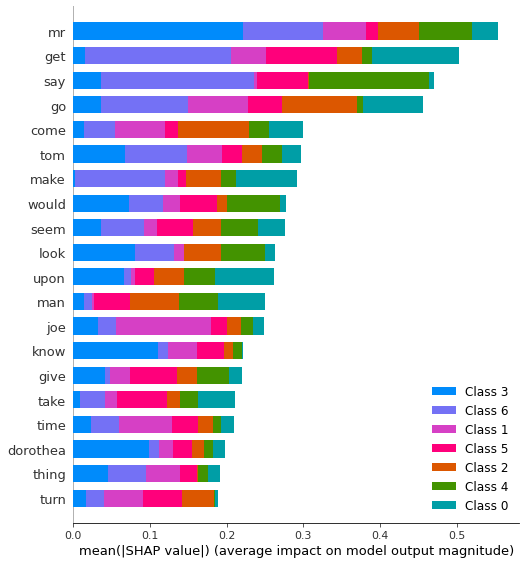

In [15]:
shap.summary_plot(shap_values, X_test_tfidf, feature_names=tfidf.get_feature_names_out())


In [16]:
decodedY

array(['Arthur Conan Doyle', 'Charles Dickens', 'Edgar Allan Poe',
       'George Eliot', 'Jack London', 'Jane Austin', 'Mark Twain'],
      dtype=object)

In [17]:

shap.initjs()
ind = 9
author_index = 3

shap.force_plot(
explainer.expected_value[author_index], shap_values[author_index][ind,:], X_test_tfidf.toarray()[ind,:],
feature_names=tfidf.get_feature_names_out()
)

In [18]:
lr_model_tf.predict(X_test_tfidf[ind]), testY[ind]

(array([3]), 3)

## TRAIN TRANSFORMER MODEL 

In [ ]:
!pip install datasets transformers[sentencepiece]

from datasets import load_dataset
from transformers import AutoTokenizer, DataCollatorWithPadding
from datasets import Dataset, DatasetDict
import transformers

In [20]:
def prepare_data(X, y):
    data = []
    for i, (sequence, label) in enumerate(zip(X, y)):
        data.append(
        {"paragraph":sequence,
        "label":label,
        "idx":i
        })
        df = pd.DataFrame(data)
    return Dataset.from_pandas(df)

In [21]:
authors_dataset = DatasetDict()

authors_dataset["train"] = prepare_data(trainX, trainY)
authors_dataset["validation"] = prepare_data(testX, testY)

In [22]:
checkpoint = "distilbert-base-uncased"
tokenizer = AutoTokenizer.from_pretrained(checkpoint)

def tokenize_function(example):
    return tokenizer(example["paragraph"], truncation=True)

tokenized_datasets = authors_dataset.map(tokenize_function, batched=True)

data_collator = DataCollatorWithPadding(tokenizer=tokenizer, return_tensors="tf")

tf_train_dataset = tokenized_datasets["train"].to_tf_dataset(
columns=["attention_mask", "input_ids", "token_type_ids"],
label_cols=["labels"],
shuffle=True,
collate_fn=data_collator,
batch_size=16,
)

tf_validation_dataset = tokenized_datasets["validation"].to_tf_dataset(
columns=["attention_mask", "input_ids", "token_type_ids"],
label_cols=["labels"],
shuffle=False,
collate_fn=data_collator,
batch_size=16,
)

Downloading:   0%|          | 0.00/28.0 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/483 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/226k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/455k [00:00<?, ?B/s]

  0%|          | 0/1 [00:00<?, ?ba/s]

  0%|          | 0/1 [00:00<?, ?ba/s]

In [23]:
from transformers import TFAutoModelForSequenceClassification

model = TFAutoModelForSequenceClassification.from_pretrained(checkpoint, num_labels=7)
from tensorflow.keras.optimizers.schedules import PolynomialDecay



Downloading:   0%|          | 0.00/347M [00:00<?, ?B/s]

Some layers from the model checkpoint at distilbert-base-uncased were not used when initializing TFDistilBertForSequenceClassification: ['vocab_projector', 'vocab_transform', 'vocab_layer_norm', 'activation_13']
- This IS expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFDistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['pre_classifier', 'classifier', 'dropout_19']
You should probably TRAIN this model on a down-stream task to be able to use i

In [24]:
batch_size = 16
num_epochs = 5
# The number of training steps is the number of samples in the dataset, divided by the batch size then multiplied
# by the total number of epochs. Note that the tf_train_dataset here is a batched tf.data.Dataset,
# not the original Hugging Face Dataset, so its len() is already num_samples // batch_size.
num_train_steps = len(tf_train_dataset) * num_epochs
lr_scheduler = PolynomialDecay(
initial_learning_rate=5e-5, end_learning_rate=0.0, decay_steps=num_train_steps
)
from tensorflow.keras.optimizers import Adam

opt = Adam(learning_rate=lr_scheduler)

In [25]:
import tensorflow as tf

model = TFAutoModelForSequenceClassification.from_pretrained(checkpoint, num_labels=7)
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)

model.compile(optimizer=opt, loss=loss, metrics=["accuracy"])
model_history = model.fit(tf_train_dataset, validation_data=tf_validation_dataset, epochs=num_epochs)

Some layers from the model checkpoint at distilbert-base-uncased were not used when initializing TFDistilBertForSequenceClassification: ['vocab_projector', 'vocab_transform', 'vocab_layer_norm', 'activation_13']
- This IS expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFDistilBertForSequenceClassification from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFDistilBertForSequenceClassification were not initialized from the model checkpoint at distilbert-base-uncased and are newly initialized: ['pre_classifier', 'classifier', 'dropout_39']
You should probably TRAIN this model on a down-stream task to be able to use i

Epoch 1/5
43/43 [==============================] - 59s 1s/step - loss: 1.7452 - accuracy: 0.3328 - val_loss: 1.4448 - val_accuracy: 0.5600
Epoch 2/5
43/43 [==============================] - 42s 980ms/step - loss: 1.1055 - accuracy: 0.6730 - val_loss: 0.9093 - val_accuracy: 0.7133
Epoch 3/5
43/43 [==============================] - 43s 995ms/step - loss: 0.5824 - accuracy: 0.8721 - val_loss: 0.6286 - val_accuracy: 0.7933
Epoch 4/5
43/43 [==============================] - 43s 1s/step - loss: 0.3134 - accuracy: 0.9520 - val_loss: 0.5687 - val_accuracy: 0.8300
Epoch 5/5
43/43 [==============================] - 44s 1s/step - loss: 0.2170 - accuracy: 0.9724 - val_loss: 0.5125 - val_accuracy: 0.8400


In [29]:
import transformers

pipeline_distilbert = transformers.pipeline("text-classification", model=model, tokenizer=AutoTokenizer.from_pretrained("distilbert-base-uncased"), device=0, return_all_scores=True)

explainer_distilbert = shap.Explainer(pipeline_distilbert)

shap_values = explainer_distilbert(testX[:5])
shap.plots.text(shap_values)

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  20%|██        | 1/5 [00:00<?, ?it/s]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  60%|██████    | 3/5 [01:12<00:32, 16.25s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer:  80%|████████  | 4/5 [01:44<00:22, 22.91s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 100%|██████████| 5/5 [02:17<00:00, 26.54s/it]

  0%|          | 0/248 [00:00<?, ?it/s]

Partition explainer: 6it [02:49, 33.98s/it]


In [28]:
decodedY

array(['Arthur Conan Doyle', 'Charles Dickens', 'Edgar Allan Poe',
       'George Eliot', 'Jack London', 'Jane Austin', 'Mark Twain'],
      dtype=object)